#### GGIS 517 Final Project
#### Exploratory Data Analysis and Spatial Distribution of Mobility Dataset in the United States of America
#### Dhruv Mehta

In [1]:
import pandas as pd
import numpy as np
from pprint import pprint
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('mobility.csv')
pd.set_option('display.max_columns', None)

In [3]:
df.head()

,ID,Name,Mobility,State,Population,Urban,Black,Seg_racial,Seg_income,Seg_poverty,Seg_affluence,Commute,Income,Gini,Share01,Gini_99,Middle_class,Local_tax_rate,Local_gov_spending,Progressivity,EITC,School_spending,Student_teacher_ratio,Test_scores,HS_dropout,Colleges,Tuition,Graduation,Labor_force_participation,Manufacturing,Chinese_imports,Teenage_labor,Migration_in,Migration_out,Foreign_born,Social_capital,Religious,Violent_crime,Single_mothers,Divorced,Married,Longitude,Latitude
0,100,Johnson City,0.062199,TN,576081,1,0.021,0.090,0.035,0.030,0.038,0.325,31560,0.468,13.459,0.333,0.548,0.020,1886.0,0.0,0.0,5.185,NaN,2.728,-0.015,0.014,4817.0,-0.002,0.587,0.237,5.294,0.004,0.006,0.005,0.012,-0.298,0.514,0.001,0.190,0.110,0.601,-82.436386,36.470371
1,200,Morristown,0.053652,TN,227816,1,0.020,0.093,0.026,0.028,0.025,0.276,29959,0.435,10.631,0.328,0.538,0.023,2004.0,0.0,0.0,4.506,NaN,-3.400,-0.024,0.009,4762.0,-0.101,0.625,0.238,3.030,0.005,0.016,0.014,0.023,-0.767,0.544,0.002,0.185,0.116,0.613,-83.407249,36.096539
2,301,Middlesborough,0.072635,TN,66708,0,0.015,0.064,0.024,0.015,0.026,0.359,22328,0.441,10.691,0.334,0.467,0.015,1190.0,0.0,0.0,5.614,15.1,-9.315,-0.005,0.045,11840.0,0.111,0.479,0.234,2.063,0.003,0.008,0.012,0.007,-1.270,0.668,0.001,0.211,0.113,0.590,-83.535332,36.551540
3,302,Knoxville,0.056281,TN,727600,1,0.056,0.210,0.092,0.084,0.102,0.269,35884,0.508,15.080,0.358,0.504,0.019,2357.0,0.0,0.0,4.900,NaN,-6.032,-0.011,0.011,3480.0,-0.024,0.615,0.146,1.078,0.004,0.016,0.014,0.020,-0.222,0.602,0.001,0.206,0.114,0.575,-84.242790,35.952259
4,401,Winston-Salem,0.044801,NC,493180,1,0.174,0.262,0.072,0.061,0.081,0.292,38892,0.466,11.917,0.346,0.500,0.018,1891.0,1.0,0.0,5.463,15.4,-2.297,0.023,0.014,9715.0,0.052,0.656,0.215,1.016,0.004,0.022,0.019,0.053,-0.018,0.488,0.003,0.220,0.092,0.586,-80.505333,36.081276


In [4]:
df.shape

(741, 43)

In [5]:
df.columns

Index(['ID', 'Name', 'Mobility', 'State', 'Population', 'Urban', 'Black',
       'Seg_racial', 'Seg_income', 'Seg_poverty', 'Seg_affluence', 'Commute',
       'Income', 'Gini', 'Share01', 'Gini_99', 'Middle_class',
       'Local_tax_rate', 'Local_gov_spending', 'Progressivity', 'EITC',
       'School_spending', 'Student_teacher_ratio', 'Test_scores', 'HS_dropout',
       'Colleges', 'Tuition', 'Graduation', 'Labor_force_participation',
       'Manufacturing', 'Chinese_imports', 'Teenage_labor', 'Migration_in',
       'Migration_out', 'Foreign_born', 'Social_capital', 'Religious',
       'Violent_crime', 'Single_mothers', 'Divorced', 'Married', 'Longitude',
       'Latitude'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 741 entries, 0 to 740
Data columns (total 43 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID                         741 non-null    int64  
 1   Name                       741 non-null    object 
 2   Mobility                   729 non-null    float64
 3   State                      741 non-null    object 
 4   Population                 741 non-null    int64  
 5   Urban                      741 non-null    int64  
 6   Black                      741 non-null    float64
 7   Seg_racial                 741 non-null    float64
 8   Seg_income                 741 non-null    float64
 9   Seg_poverty                741 non-null    float64
 10  Seg_affluence              741 non-null    float64
 11  Commute                    741 non-null    float64
 12  Income                     741 non-null    int64  
 13  Gini                       741 non-null    float64

In [7]:
df.nunique()

ID                           741
Name                         685
Mobility                     721
State                         51
Population                   739
Urban                          2
Black                        226
Seg_racial                   291
Seg_income                   125
Seg_poverty                  113
Seg_affluence                136
Commute                      404
Income                       719
Gini                         290
Share01                      690
Gini_99                      215
Middle_class                 283
Local_tax_rate                52
Local_gov_spending           625
Progressivity                 18
EITC                          15
School_spending              671
Student_teacher_ratio        120
Test_scores                  695
HS_dropout                   102
Colleges                      75
Tuition                      528
Graduation                   343
Labor_force_participation    231
Manufacturing                287
Chinese_im

In [8]:
df.isnull().sum()

ID                             0
Name                           0
Mobility                      12
State                          0
Population                     0
Urban                          0
Black                          0
Seg_racial                     0
Seg_income                     0
Seg_poverty                    0
Seg_affluence                  0
Commute                        0
Income                         0
Gini                           0
Share01                       32
Gini_99                       32
Middle_class                  32
Local_tax_rate                 1
Local_gov_spending             2
Progressivity                  0
EITC                           0
School_spending               10
Student_teacher_ratio         30
Test_scores                   36
HS_dropout                   148
Colleges                     157
Tuition                      161
Graduation                   160
Labor_force_participation      0
Manufacturing                  0
Chinese_im

#### Number of Entries Heatmap

In [9]:
# Create HeatMap
from folium.plugins import HeatMap
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    tiles='Stamen Terrain',
    attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL',
    zoom_start=4,
    control_scale=True
)

df['count'] = 1
property_heatmap = HeatMap(
    data=df[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(), 
    name = 'Heatmap',
    radius = 10, 
    min_opacity = 0.1, 
    max_zoom=16,
    opacity = 10
).add_to(property_map)
         
folium.LayerControl().add_to(property_map)
property_map

#### Population Heatmap

In [10]:
# Create HeatMap
from folium.plugins import HeatMap
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    tiles='Stamen Terrain',
    attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL',
    zoom_start=4,
    control_scale=True
)

property_heatmap = HeatMap(
    data=df[['Latitude', 'Longitude', 'Population']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(), 
    name = 'Heatmap',
    radius = 10, 
    min_opacity = 0.1, 
    max_zoom=16,
    opacity = 10
).add_to(property_map)
         
folium.LayerControl().add_to(property_map)
property_map

In [11]:
# Create Map: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4.5,
    control_scale=True
)

for i in range(len(df)):
    
    folium.CircleMarker(
        location = [df.Latitude.iloc[i], df.Longitude.iloc[i]],
        radius = 4,
        popup = df.Population.iloc[i],
        color = 'blue',
        opacity = 0.2
    ).add_to(property_map) 
    
property_map

In [12]:
# Create Map with clustering: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4,
    control_scale=True)

mc = MarkerCluster()

#creating a Marker for each point in dataframe. Each point will get a popup with their unique identifier (cid) value
for row in df.itertuples():
    mc.add_child(folium.Marker(location=[row.Latitude,row.Longitude], popup=row.Population))
property_map.add_child(mc)
property_map

In [13]:
df['racial_pop'] = df['Population']*df['Seg_racial']
df['poor_pop'] = df['Population']*df['Seg_poverty']
df

,ID,Name,Mobility,State,Population,Urban,Black,Seg_racial,Seg_income,Seg_poverty,Seg_affluence,Commute,Income,Gini,Share01,Gini_99,Middle_class,Local_tax_rate,Local_gov_spending,Progressivity,EITC,School_spending,Student_teacher_ratio,Test_scores,HS_dropout,Colleges,Tuition,Graduation,Labor_force_participation,Manufacturing,Chinese_imports,Teenage_labor,Migration_in,Migration_out,Foreign_born,Social_capital,Religious,Violent_crime,Single_mothers,Divorced,Married,Longitude,Latitude,count,racial_pop,poor_pop
0,100,Johnson City,0.062199,TN,576081,1,0.021,0.090,0.035,0.030,0.038,0.325,31560,0.468,13.459,0.333,0.548,0.020,1886.0,0.0,0.00,5.185,NaN,2.728,-0.015,0.014,4817.0,-0.002,0.587,0.237,5.294,0.004,0.006,0.005,0.012,-0.298,0.514,0.001,0.190,0.110,0.601,-82.436386,36.470371,1,51847.290,17282.430
1,200,Morristown,0.053652,TN,227816,1,0.020,0.093,0.026,0.028,0.025,0.276,29959,0.435,10.631,0.328,0.538,0.023,2004.0,0.0,0.00,4.506,NaN,-3.400,-0.024,0.009,4762.0,-0.101,0.625,0.238,3.030,0.005,0.016,0.014,0.023,-0.767,0.544,0.002,0.185,0.116,0.613,-83.407249,36.096539,1,21186.888,6378.848
2,301,Middlesborough,0.072635,TN,66708,0,0.015,0.064,0.024,0.015,0.026,0.359,22328,0.441,10.691,0.334,0.467,0.015,1190.0,0.0,0.00,5.614,15.1,-9.315,-0.005,0.045,11840.0,0.111,0.479,0.234,2.063,0.003,0.008,0.012,0.007,-1.270,0.668,0.001,0.211,0.113,0.590,-83.535332,36.551540,1,4269.312,1000.620
3,302,Knoxville,0.056281,TN,727600,1,0.056,0.210,0.092,0.084,0.102,0.269,35884,0.508,15.080,0.358,0.504,0.019,2357.0,0.0,0.00,4.900,NaN,-6.032,-0.011,0.011,3480.0,-0.024,0.615,0.146,1.078,0.004,0.016,0.014,0.020,-0.222,0.602,0.001,0.206,0.114,0.575,-84.242790,35.952259,1,152796.000,61118.400
4,401,Winston-Salem,0.044801,NC,493180,1,0.174,0.262,0.072,0.061,0.081,0.292,38892,0.466,11.917,0.346,0.500,0.018,1891.0,1.0,0.00,5.463,15.4,-2.297,0.023,0.014,9715.0,0.052,0.656,0.215,1.016,0.004,0.022,0.019,0.053,-0.018,0.488,0.003,0.220,0.092,0.586,-80.505333,36.081276,1,129213.160,30083.980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,39205,John Day,0.115854,OR,7935,0,0.001,0.002,0.002,0.004,0.001,0.579,32736,0.311,4.400,0.267,0.584,0.013,3429.0,0.0,1.19,7.887,15.1,12.204,-0.039,NaN,NaN,NaN,0.615,0.099,0.083,0.005,0.003,0.015,0.015,0.208,0.331,0.000,0.195,0.108,0.628,-118.531197,44.594025,1,15.870,31.740
737,39301,Friday Harbor,0.101695,WA,14077,0,0.002,0.010,0.012,0.022,0.001,0.628,58628,0.796,60.527,0.190,0.560,0.018,2971.0,0.0,0.00,6.766,18.3,-3.884,NaN,NaN,NaN,NaN,0.587,0.063,0.821,0.007,0.024,0.021,0.060,2.716,0.171,0.000,0.219,0.148,0.604,-123.052956,48.525379,1,140.770,309.694
738,39302,Bellingham,0.115575,WA,166814,1,0.006,0.057,0.046,0.051,0.042,0.418,35491,0.416,12.245,0.294,0.564,0.021,2615.0,0.0,0.00,5.912,21.1,5.120,NaN,0.024,2682.0,0.186,0.665,0.122,1.324,0.005,0.034,0.028,0.098,0.063,0.294,0.001,0.195,0.099,0.538,-121.263443,48.831154,1,9508.398,8507.514
739,39303,Port Angeles,0.085840,WA,90478,0,0.007,0.122,0.025,0.028,0.024,0.486,39625,0.414,12.848,0.285,0.575,0.015,3201.0,0.0,0.00,6.609,19.5,3.012,NaN,0.011,1641.0,-0.183,0.522,0.077,0.165,0.004,0.034,0.021,0.043,0.476,0.260,0.001,0.235,0.124,0.598,-123.544647,47.912067,1,11038.316,2533.384


In [14]:
df_groupby_racial_perc = df.groupby(['State']).mean('racial_pop')
df_groupby_racial_perc['Perc_Racial'] = round(((df_groupby_racial_perc['racial_pop']*100)/df_groupby_racial_perc['Population']), 2)

df_groupby_poor_perc = df.groupby(['State']).mean('poor_pop')
df_groupby_poor_perc['Perc_Poor'] = round(((df_groupby_poor_perc['poor_pop']*100)/df_groupby_poor_perc['Population']), 2)

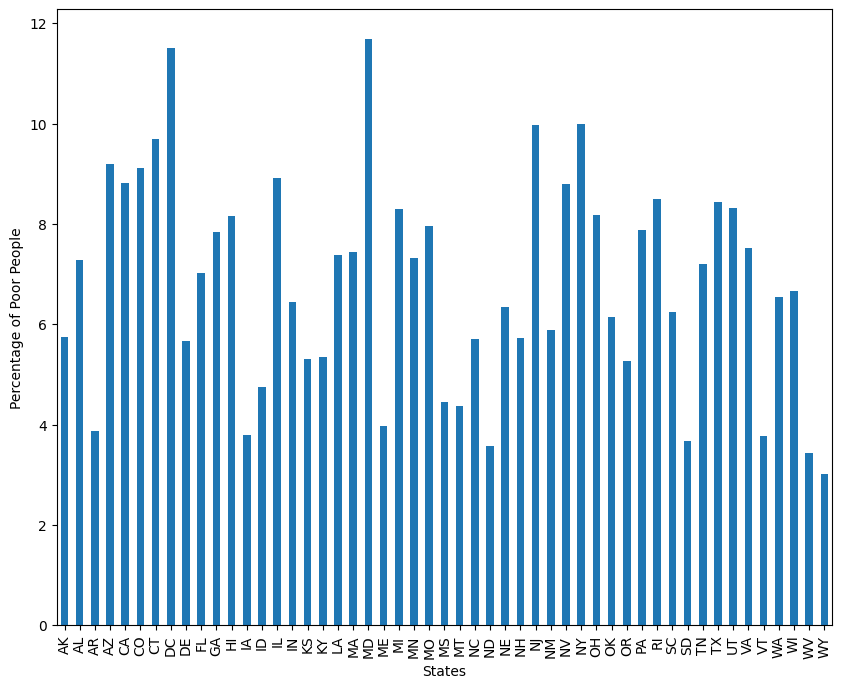

In [15]:
plt.figure(figsize=(10,8))
df_groupby_poor_perc['Perc_Poor'].plot(kind = 'bar')
plt.xlabel("States")
plt.ylabel("Percentage of Poor People")
plt.show()

In [16]:
# Create Map with clustering: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4,
    control_scale=True)

mc = MarkerCluster()

#creating a Marker for each point in dataframe. Each point will get a popup with their unique identifier (cid) value
for row in df.itertuples():
    mc.add_child(folium.Marker(location=[row.Latitude,row.Longitude], popup=row.racial_pop))
property_map.add_child(mc)
property_map

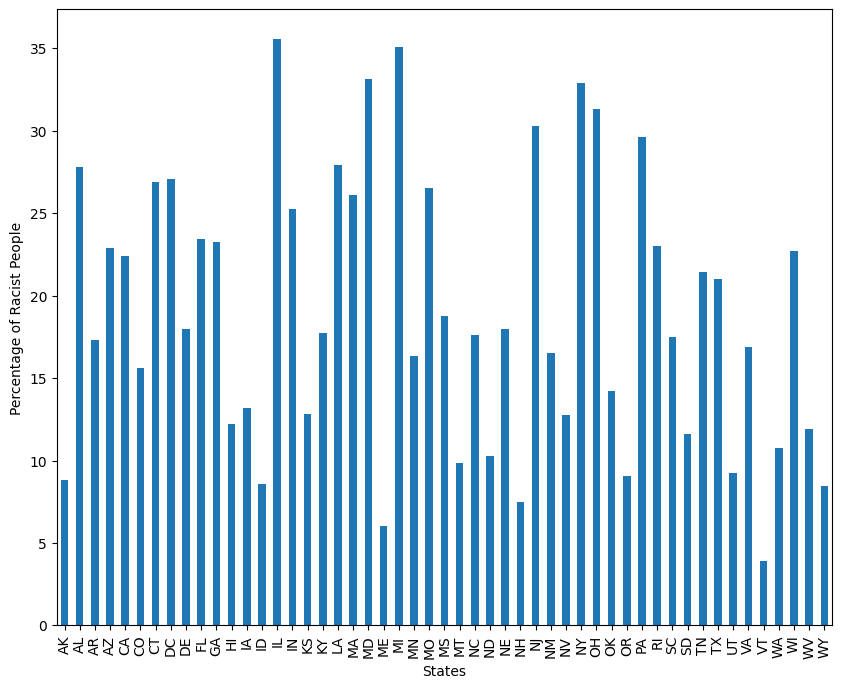

In [17]:
plt.figure(figsize=(10,8))
df_groupby_racial_perc['Perc_Racial'].plot(kind = 'bar')
plt.xlabel("States")
plt.ylabel("Percentage of Racist People")
plt.show()

In [18]:
# Create Map with clustering: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4,
    control_scale=True)

mc = MarkerCluster()

#creating a Marker for each point in dataframe. Each point will get a popup with their unique identifier (cid) value
for row in df.itertuples():
    mc.add_child(folium.Marker(location=[row.Latitude,row.Longitude], popup=row.poor_pop))
property_map.add_child(mc)
property_map

In [19]:
df_income_gt_mean = df[df['Income']>df['Income'].mean()]
df_income_lt_mean = df[df['Income']<df['Income'].mean()]

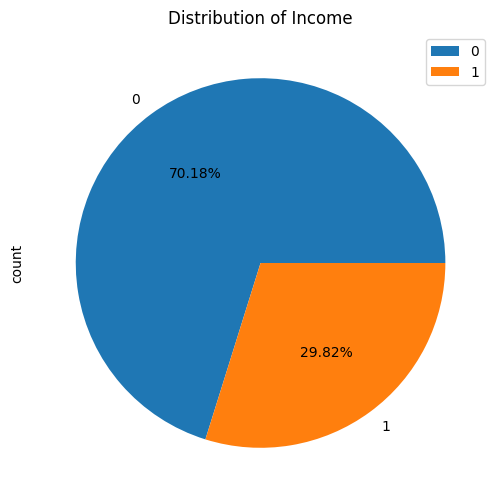

In [20]:
plt.figure(figsize=(6,6))
df_income_lt_mean['Urban'].value_counts().plot(kind = 'pie', autopct='%1.2f%%')
plt.legend(loc=1)
plt.title("Distribution of Income")
plt.show()

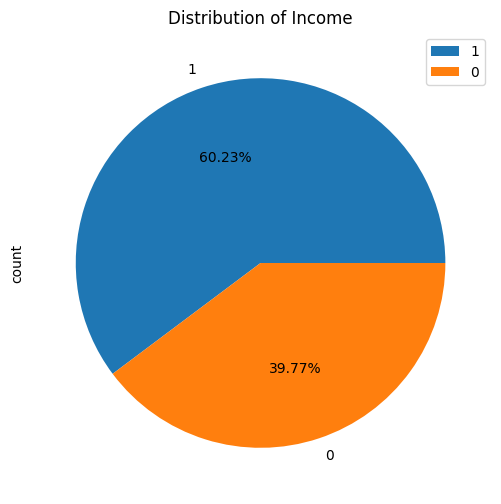

In [21]:
plt.figure(figsize=(6,6))
df_income_gt_mean['Urban'].value_counts().plot(kind = 'pie', autopct='%1.2f%%')
plt.legend(loc=1)
plt.title("Distribution of Income")
plt.show()

In [22]:
# Create Map with clustering: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4,
    control_scale=True)

mc = MarkerCluster()

#creating a Marker for each point in dataframe. Each point will get a popup with their unique identifier (cid) value
for row in df.itertuples():
    mc.add_child(folium.Marker(location=[row.Latitude,row.Longitude], popup=row.racial_pop))
property_map.add_child(mc)
property_map

In [23]:
df_groupby_state = df.groupby('State').mean('Income')

# Create Map: Basemap - OpenStreet Map
property_map = folium.Map(
    location=[df['Latitude'].mean(), 
              df['Longitude'].mean()], 
    zoom_start=4,
    control_scale=True
)

for i in range(len(df_groupby_state)):
    
    folium.CircleMarker(
        location = [df_groupby_state.Latitude.iloc[i], df_groupby_state.Longitude.iloc[i]],
        radius = 3,
        popup = df_groupby_state.Income.iloc[i],
        color = 'blue',
        opacity = 0.2
    ).add_to(property_map) 
    
property_map

In [24]:
df_urban = df[df['Urban']==1]
df_rural = df[df['Urban']==0]

df_rural_groupby_state = df_rural.groupby(['State']).mean('Black')
df_urban_groupby_state = df_urban.groupby(['State']).mean('Black')

In [25]:
# Create HeatMap
from folium.plugins import HeatMap
property_map = folium.Map(
    location=[df_rural_groupby_state['Latitude'].mean(), 
              df_rural_groupby_state['Longitude'].mean()], 
    tiles='Stamen Terrain',
    attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL',
    zoom_start=4,
    control_scale=True
)

property_heatmap = HeatMap(
    data=df_rural_groupby_state[['Latitude', 'Longitude', 'Black']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(), 
    name = 'Heatmap',
    radius = 10, 
    min_opacity = 0.1, 
    max_zoom=16,
    opacity = 20
).add_to(property_map)
         
folium.LayerControl().add_to(property_map)
property_map

In [26]:
# Create HeatMap
from folium.plugins import HeatMap
property_map = folium.Map(
    location=[df_urban_groupby_state['Latitude'].mean(), 
              df_urban_groupby_state['Longitude'].mean()], 
    tiles='Stamen Terrain',
    attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL',
    zoom_start=4,
    control_scale=True
)

property_heatmap = HeatMap(
    data=df_urban_groupby_state[['Latitude', 'Longitude', 'Black']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(), 
    name = 'Heatmap',
    radius = 10, 
    min_opacity = 0.1, 
    max_zoom=16,
    opacity = 20
).add_to(property_map)
         
folium.LayerControl().add_to(property_map)
property_map

### Correlation Plots

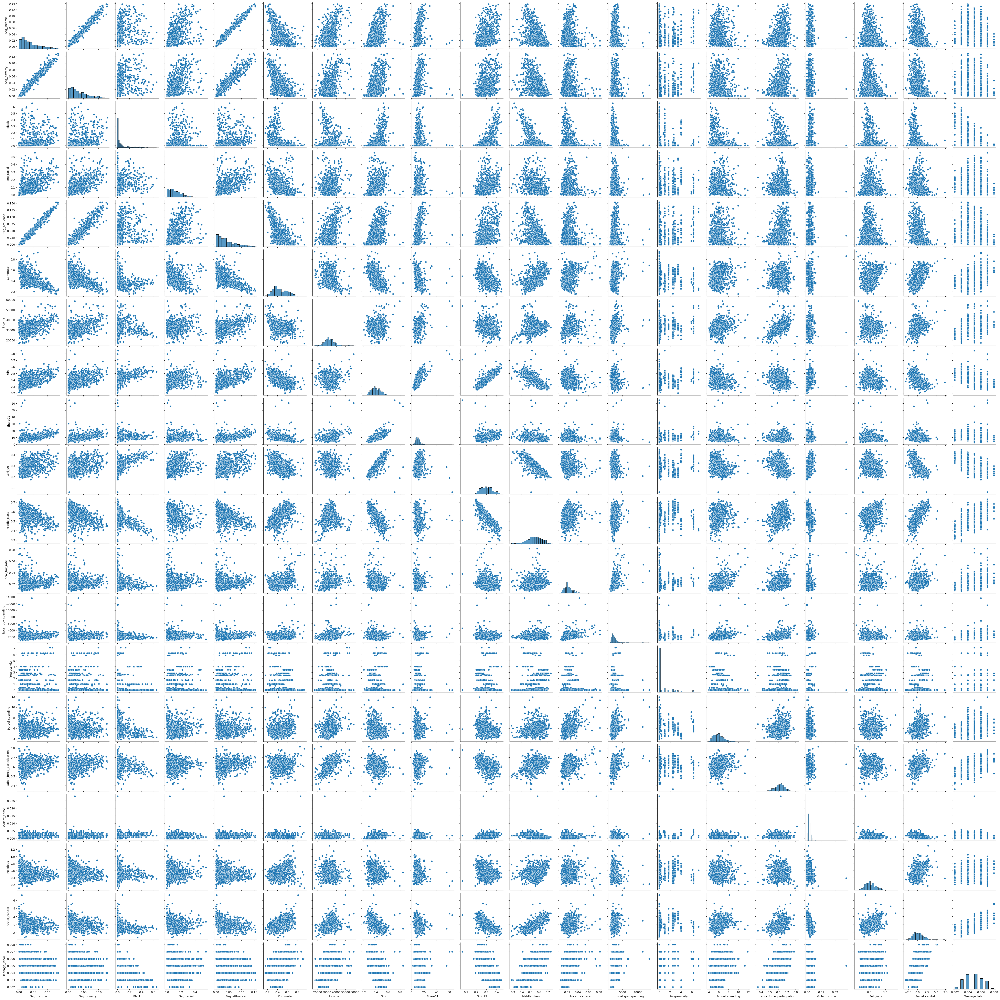

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
df_wo_category = df[['Seg_income', 'Seg_poverty', 'Black', 'Seg_racial', 'Seg_affluence', 'Commute', 'Income', 'Gini', 'Share01', 'Gini_99',
                     'Middle_class', 'Local_tax_rate', 'Local_gov_spending', 'Progressivity', 'School_spending', 'Labor_force_participation',
                     'Violent_crime', 'Religious', 'Social_capital', 'Teenage_labor']] 
sns.pairplot(df_wo_category)
plt.savefig('correlation_plot.png')
plt.show()